**Install Detectron2**

In [1]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 4.9 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15676, done.
remote: Counting objects: 100% (399/399), done.
remote: Compressing objects: 100% (305/305), done.
remote: Total 15676 (delta 176), reused 285 (delta 94), pack-reused 15277
Receiving objects: 100% (15676/15676), 6.51 MiB | 14.84 MiB/s, done.
Resolving deltas: 100% (11292/11292), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.1 MB/s eta 0:00

In [2]:

import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)


nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.2 ; cuda:  cu121
detectron2: 0.6


In [3]:

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog


In [4]:
"""my_new_image = cv2.imread("/content/dhaka-superJumbo.jpeg")
cv2_imshow(my_new_image)"""

'my_new_image = cv2.imread("/content/dhaka-superJumbo.jpeg")\ncv2_imshow(my_new_image)'

In [5]:
"""
cfg_inst = get_cfg()
cfg_inst.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg_inst.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg_inst.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg_inst)
outputs = predictor(my_new_image)

v = Visualizer(my_new_image[:, :, ::-1], MetadataCatalog.get(cfg_inst.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])"""

'\ncfg_inst = get_cfg()\ncfg_inst.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))\ncfg_inst.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5\ncfg_inst.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")\npredictor = DefaultPredictor(cfg_inst)\noutputs = predictor(my_new_image)\n\nv = Visualizer(my_new_image[:, :, ::-1], MetadataCatalog.get(cfg_inst.DATASETS.TRAIN[0]), scale=1.2)\nout = v.draw_instance_predictions(outputs["instances"].to("cpu"))\ncv2_imshow(out.get_image()[:, :, ::-1])'

**Panoptic segmentation = Instance segmentation + Semantic Segmentation**





In [6]:
"""
cfg_pan = get_cfg()
cfg_pan.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg_pan.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
predictor = DefaultPredictor(cfg_pan)
panoptic_seg, segments_info = predictor(my_new_image)["panoptic_seg"]
v = Visualizer(my_new_image[:, :, ::-1], MetadataCatalog.get(cfg_pan.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)
cv2_imshow(out.get_image()[:, :, ::-1])"""

'\ncfg_pan = get_cfg()\ncfg_pan.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))\ncfg_pan.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")\npredictor = DefaultPredictor(cfg_pan)\npanoptic_seg, segments_info = predictor(my_new_image)["panoptic_seg"]\nv = Visualizer(my_new_image[:, :, ::-1], MetadataCatalog.get(cfg_pan.DATASETS.TRAIN[0]), scale=1.2)\nout = v.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)\ncv2_imshow(out.get_image()[:, :, ::-1])'

# Aerial Solar Panels Image Dataset

In [7]:
"""!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="B6b9Bs8mqVZzXW4kNSVt")
project = rf.workspace("first-swagg").project("satseg")
version = project.version(2)
dataset = version.download("coco")
"""

'!pip install roboflow\n\nfrom roboflow import Roboflow\nrf = Roboflow(api_key="B6b9Bs8mqVZzXW4kNSVt")\nproject = rf.workspace("first-swagg").project("satseg")\nversion = project.version(2)\ndataset = version.download("coco")\n'

In [8]:
%%capture
!pip install roboflow

In [9]:




from roboflow import Roboflow
rf = Roboflow(api_key="B6b9Bs8mqVZzXW4kNSVt")
project = rf.workspace("andrew-hannell").project("aircraft-6zuuw")
version = project.version(1)
dataset = version.download("coco")



loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to aircraft-1 in coco:: 100%|██████████| 1205/1205 [00:00<00:00, 1603.78it/s]


In [10]:
from detectron2.data.datasets import register_coco_instances

register_coco_instances("my_dataset_train", {}, "/content/aircraft-1/train/_annotations.coco.json", "/content/aircraft-1/train")
register_coco_instances("my_dataset_val", {}, "/content/aircraft-1/test/_annotations.coco.json", "/content/aircraft-1/test")

In [11]:
train_metadata = MetadataCatalog.get("my_dataset_train")
train_dataset_dicts = DatasetCatalog.get("my_dataset_train")

WARNING [05/14 20:46:24 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/14 20:46:24 d2.data.datasets.coco]: Loaded 1047 images in COCO format from /content/aircraft-1/train/_annotations.coco.json


In [12]:
val_metadata = MetadataCatalog.get("my_dataset_val")
val_dataset_dicts = DatasetCatalog.get("my_dataset_val")

WARNING [05/14 20:46:24 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/14 20:46:24 d2.data.datasets.coco]: Loaded 50 images in COCO format from /content/aircraft-1/test/_annotations.coco.json


In [13]:
from matplotlib import pyplot as plt

for d in random.sample(train_dataset_dicts, 2):
  plt.figure(figsize=(10, 8))
  img = cv2.imread(d["file_name"])
  visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
  vis = visualizer.draw_dataset_dict(d)
  plt.imshow(vis.get_image()[:, :, ::-1])
  plt.show()

Output hidden; open in https://colab.research.google.com to view.

# Train

In [14]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.OUTPUT_DIR = "/content/Detectron2_Models"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025


#cfg.SOLVER.MAX_ITER = 1000

# Calculate the number of iterations needed for the desired number of epochs
desired_number_of_epochs = 5
num_images = len(train_dataset_dicts)
iterations_per_epoch = num_images // cfg.SOLVER.IMS_PER_BATCH
cfg.SOLVER.MAX_ITER = iterations_per_epoch * desired_number_of_epochs


cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256
cfg.MODEL.ROI_HEADS.NUM_CLASSES =11

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)


# Calculate the number of iterations needed for the desired number of epochs
desired_number_of_epochs = 10
num_images = len(train_dataset_dicts)
iterations_per_epoch = num_images // cfg.SOLVER.IMS_PER_BATCH
cfg.SOLVER.MAX_ITER = iterations_per_epoch * desired_number_of_epochs


[05/14 20:46:34 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:00, 194MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


Train

In [15]:
trainer.train()

[05/14 20:46:36 d2.engine.train_loop]: Starting training from iteration 0


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)


ERROR [05/14 20:46:40 d2.engine.train_loop]: Exception during training:
Traceback (most recent call last):
  File "/content/detectron2/detectron2/engine/train_loop.py", line 155, in train
    self.run_step()
  File "/content/detectron2/detectron2/engine/defaults.py", line 498, in run_step
    self._trainer.run_step()
  File "/content/detectron2/detectron2/engine/train_loop.py", line 310, in run_step
    loss_dict = self.model(data)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1511, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1520, in _call_impl
    return forward_call(*args, **kwargs)
  File "/content/detectron2/detectron2/modeling/meta_arch/rcnn.py", line 167, in forward
    _, detector_losses = self.roi_heads(images, features, proposals, gt_instances)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1511, in _wra

AttributeError: Cannot find field 'gt_masks' in the given Instances!

Save the config file, for potential future use

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
import yaml
config_yaml_path = "/content/Detectron2_Models/config.yaml"
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)

# Evaluation

# Inference & evaluation using the trained model

In [ ]:

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8
predictor = DefaultPredictor(cfg)

[05/14 19:28:15 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/Detectron2_Models/model_final.pth ...


Check average precision and recall.

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[05/14 19:28:16 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [05/14 19:28:16 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/14 19:28:16 d2.data.datasets.coco]: Loaded 6 images in COCO format from /content/Object-Detection-Land-Property-1/test/_annotations.coco.json
[05/14 19:28:16 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |   category   | #instances   |
|:----------:|:-------------|:------------:|:-------------|
|    land    | 0            | solar-panels | 25           |
|            |              |              |              |
|   total    | 25           |              |              |
[05/14 19:28:16 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/14 19:28:16 d2.data.common]: Serializi

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


[05/14 19:28:17 d2.evaluation.evaluator]: Total inference time: 0:00:00.132968 (0.132968 s / iter per device, on 1 devices)
[05/14 19:28:17 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.082735 s / iter per device, on 1 devices)
[05/14 19:28:17 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/14 19:28:17 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[05/14 19:28:17 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.346
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.479
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.421
 Average

**Load a new image and segment it.**

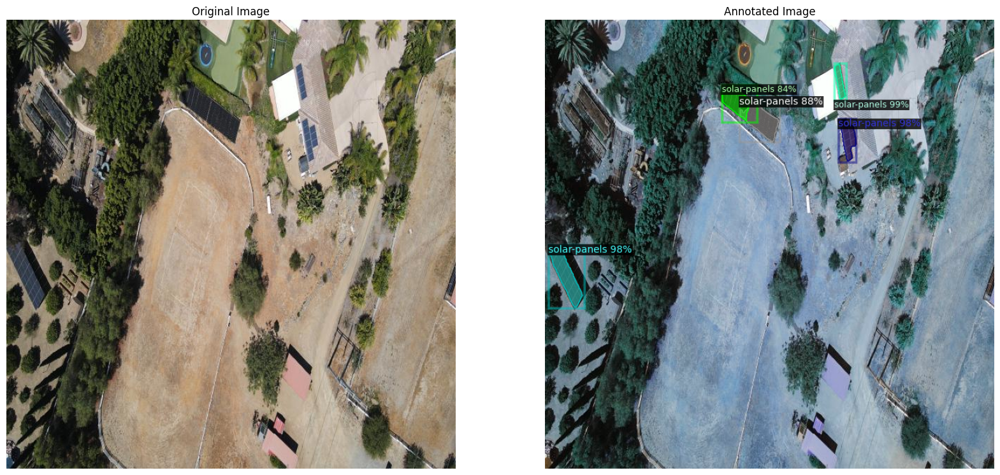

In [ ]:
import cv2
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer

# Load Image
new_im = cv2.imread("/content/Object-Detection-Land-Property-1/valid/DJI_0753_MP4-53_jpg.rf.58c6695bf256de0eae499e1c62514f37.jpg")
outputs = predictor(new_im)

# Visualization
v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

# Convert images to RGB for displaying with Matplotlib
new_im_rgb = cv2.cvtColor(new_im, cv2.COLOR_BGR2RGB)
out_img_rgb = out.get_image()[:, :, ::-1]

# Plotting the images side by side using Matplotlib
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

ax[0].imshow(new_im_rgb)
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(out_img_rgb)
ax[1].set_title("Annotated Image")
ax[1].axis("off")

plt.show()


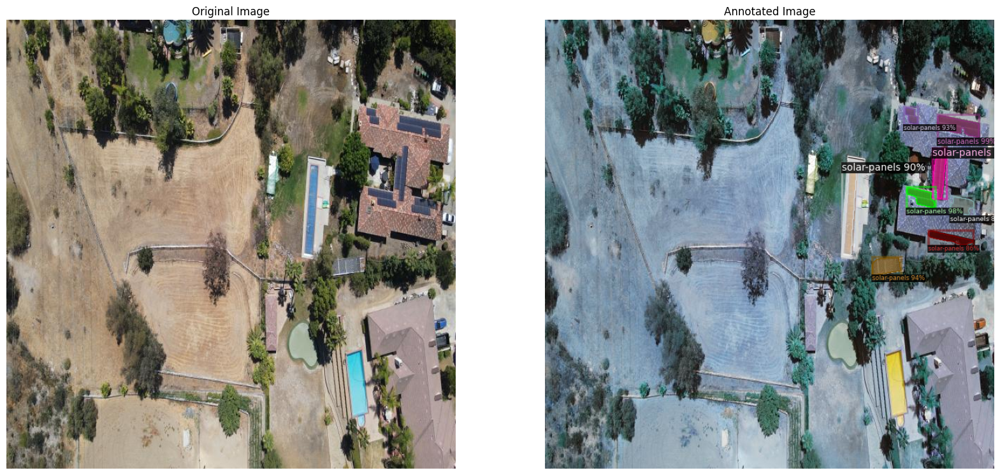

In [ ]:
import cv2
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer

# Load Image
#new_im = cv2.imread("/content/Aerial-Solar-Panels-6/valid/DJI_0753_MP4-53_jpg.rf.0964d0855cd72d9f011ad2cf2011b89b.jpg")
new_im = cv2.imread("/content/Aerial-Solar-Panels-6/test/DJI_0753_MP4-5_jpg.rf.6858b2808db95696b152ee2dfe56bdca.jpg")
outputs = predictor(new_im)

# Visualization
v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

# Convert images to RGB for displaying with Matplotlib
new_im_rgb = cv2.cvtColor(new_im, cv2.COLOR_BGR2RGB)
out_img_rgb = out.get_image()[:, :, ::-1]

# Plotting the images side by side using Matplotlib
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

ax[0].imshow(new_im_rgb)
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(out_img_rgb)
ax[1].set_title("Annotated Image")
ax[1].axis("off")

plt.show()
